# Final Project on Data Science Term 1B 2019
## Communities and Crime Data Set

### Team: 
Victoria Dochkina, Daniil Bragin

We have chosen this dataset to solve a regression problem. Data has 122 predictive and 5 non-predictive attributes, 1 goal - the crime rate (ViolentCrimesPerPop column). All numeric data was already normalized into the decimal range 0.00-1.00 using an Unsupervised, equal-interval binning method.

Dataset could be found here: https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime normalized one
https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime+Unnormalized - unnormalized one

### **You don't need to load any data - all the data in this notebook is downladed by links - from archive.ics.uci and from our github (ddvika)**

# Motivation:

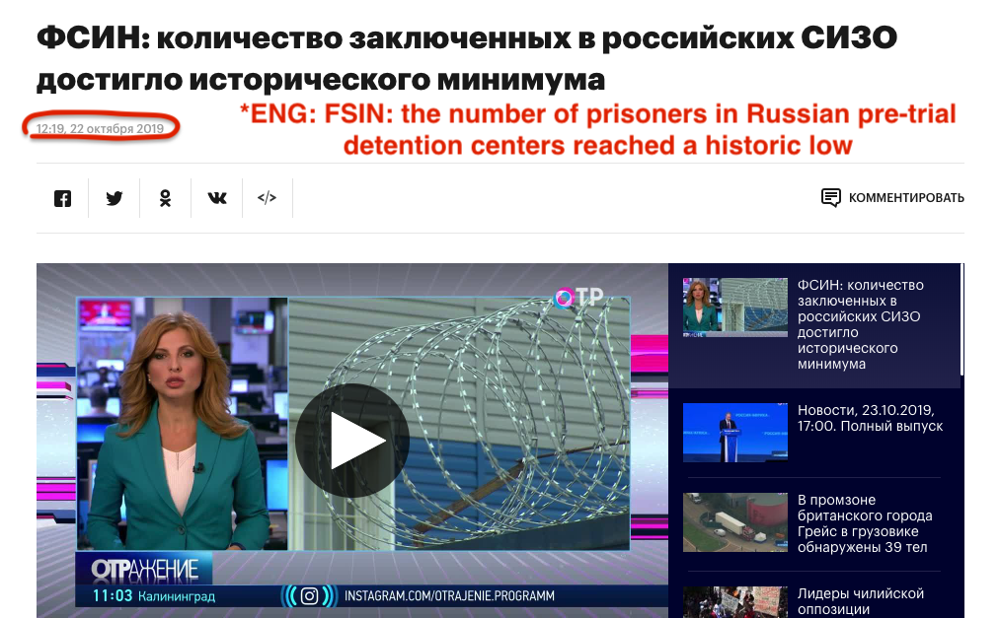

In [107]:
from PIL import ImageTk, Image
import urllib
image = Image.open(urllib.request.urlopen('https://github.com/ddvika/Final_progect_Sk/raw/master/kprisoners_russia.png'))
image

This news was published on 22nd of October. And the existing number of prisoners in Russian pre-trial detention centers could be even less. It could be achieved if Russian Police can predict most criminal cities/areas and direct more efforts and personnel to prevent crime in these exact areas. Unfortunately, there is no dataset in the public domain for crimes commited in Russia. But...Fortunately, we have another one - from USA. If a Regression Model is satisfactory, then it can be expanded to the dataset, collected for Russian crimes.


Our team chose **Communities and Crime Data Set** - this data combines socio-economic data from the 1990 US Census, 1990 US LEMAS survey, and crime data from the 1995 Federal Bureau of Investigation (FBI). It consists of 128 attributes and 1994 instances. The main target to predict is - the crime rate (Violent Crimes per Polulation). Dataset consists features like: the community, such as the percent of the population considered urban, and the median family income, per capita number of police officers, and percent of officers assigned to drug units. All numeric data was already normalized into the decimal range 0.00-1.00.

## In our research we did the following:
* Visualized distribution of Crimes across the states of US and ploted cities with highest crime rates in the USA
* Performed EDA: read data, encoded categorigal variables, removed NaN values and non-predictable features, made profile report which includes analysis of all the columns and their histograms
* Ploted Hierarchical Clustering Dendrogram and Correlation Matrix
* To reduce our data dimensions we tried different technics  like: PCA (Principal Component Analysis), RFE (Recursive Feature Ellimination) and KBest
* Implemented: **Linear Regression, Ridge Regression, Lasso Regression, SGD Regressor, BayesianRidge, ElasticNetCV, Random Forest, Decision Trees, Support Vector Regression (SVR)** and 'Grid Searched' them
* Chose the best model

# Soo...Let's START predicting CRIMES!

In [108]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy as hc
from sklearn.impute import SimpleImputer
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=True)
import string
import re
import urllib,json
from pandas.io.json import json_normalize
import plotly.graph_objs as go
%matplotlib inline

## Firstly, let's plot distribution of Crimes across the states of US

We use unnormilized data( https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime+Unnormalized)  only for building the plots - as it consists of real data values. For our Regression task we would use a normilized one

In [109]:
#load original unnormilized data for building a plot
names_unnorm = pd.read_csv("https://raw.githubusercontent.com/ddvika/Final_progect_Sk/master/attributes_unnorm.csv"
                           ,header=None)
data_unnorm = pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/00211/CommViolPredUnnormalizedData.txt"
                          ,sep="\s*,\s*",header = None,engine='python',na_values=["?"])
#set max_columns to display all the data columns
pd.set_option('display.max_columns', 150)

#insert headers to columns
data_unnorm.to_csv('communities.csv', header=list(names_unnorm[0]))
data_unnorm=pd.read_csv('communities.csv').drop(columns = ['Unnamed: 0'], axis = 1)

#3 states have missing values in 'ViolentCrimesPerPop' column - Let's fulfill then with median vals
data_unnorm.fillna(data_unnorm['ViolentCrimesPerPop'].median(),inplace=True)
print(data_unnorm.shape)

(2215, 147)


In [110]:
data_unnorm.head(4)

,communityname,state,countyCode,communityCode,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumKidsBornNeverMar,PctKidsBornNeverMar,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,OwnOccQrange,RentLowQ,RentMedian,RentHighQ,RentQrange,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,murders,murdPerPop,rapes,rapesPerPop,robberies,robbbPerPop,assaults,assaultPerPop,burglaries,burglPerPop,larcenies,larcPerPop,autoTheft,autoTheftPerPop,arsons,arsonsPerPop,ViolentCrimesPerPop,nonViolPerPop
0,BerkeleyHeightstownship,NJ,39.00,5320.00,1,11980,3.10,1.37,91.78,6.50,1.88,12.47,21.44,10.93,11.33,11980,100.0,75122,89.24,1.55,70.20,23.62,1.03,18.39,79584,29711,30233,13600,5725,27101,5115.0,22838,227,1.96,5.81,9.90,48.18,2.70,64.55,14.65,28.82,5.49,50.73,3.67,26.38,5.22,4.47,3.22,91.43,90.17,95.78,95.81,44.56,58.88,31,0.36,1277,8.69,13.00,20.99,30.93,0.93,1.39,2.24,3.30,85.68,1.37,4.81,4.17,2.99,3.00,2.84,91.46,0.39,11.06,3,64,98.37,91.01,3.12,37.50,1959,0.00,0.28,215900,262600,326900,111000,685,1001,1001,316,1001,23.8,21.1,14.0,11,0,10.66,53.72,65.29,78.09,89.14,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,6.5,1845.9,9.63,374.06,374.06,374.06,374.06,0.0,374.06,0,0.0,0.0,0.00,1.0,8.20,4.0,32.81,14.0,114.85,138.0,1132.08,16.0,131.26,2.00,16.41,41.02,1394.59
1,Marpletownship,PA,45.00,47616.00,1,23123,2.82,0.80,95.57,3.44,0.85,11.01,21.30,10.48,17.18,23123,100.0,47917,78.99,1.11,64.11,35.50,2.75,22.85,55323,20148,20191,18137,0,20074,5250.0,12222,885,3.98,5.61,13.72,29.89,2.43,61.96,12.26,29.28,6.39,37.64,4.23,27.99,6.45,5.42,3.11,86.91,85.33,96.82,86.46,51.14,62.43,43,0.24,1920,5.21,8.65,13.33,22.50,0.43,0.72,1.11,1.87,87.79,1.81,4.25,3.34,2.70,2.83,1.96,89.03,1.01,23.60,3,240,97.15,84.88,0.00,18.33,1958,0.31,0.14,136300,164200,199900,63600,467,560,672,205,627,27.6,20.7,12.5,0,0,8.30,77.17,71.27,90.22,96.12,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,374.06,10.6,2186.7,3.84,374.06,374.06,374.06,374.06,0.0,374.06,0,0.0,1.0,4.25,5.0,21.26,24.0,102.05,57.0,242.37,376.0,1598.78,26.0,110.55,1.00,4.25,127.56,1955.95
2,Tigardcity,OR,374.06,374.06,1,29344,2.43,0.74,94.33,3.43,2.35,11.36,25.88,11.01,10.28,29344,100.0,35669,82.00,1.15,55.73,22.25,2.94,14.56,42112,16946,17103,16644,21606,15528,5954.0,8405,1389,4.75,2.80,9.09,30.13,4.01,69.80,15.95,21.52,8.79,32.48,10.10,25.78,14.76,12.55,2.95,78.54,78.85,92.37,75.72,66.08,74.19,164,0.88,1468,16.42

Now we age going to use 'plotly' package to display some beautiful animated distribution plots

In [111]:
#group crime by state
crimedata__by_state = data_unnorm.groupby('state').agg({'ViolentCrimesPerPop':'mean'})[['ViolentCrimesPerPop']].reset_index()



#Plot Violent Crimes by State using 'plotly' package
data_plot = dict(type='choropleth', autocolorscale = False,
        colorscale = 'deep', locations = crimedata__by_state['state'], locationmode = 'USA-states',
        z = crimedata__by_state['ViolentCrimesPerPop'].astype('float')) #speed
layout_plot = dict(
        title = 'Distribution of Violent Crimes Per 100k Pop in the USA',geo = dict(
            scope='usa', projection=dict( type='albers usa' )
            ,showlakes = True, lakecolor = 'rgb(50,200,255)'))
    
fig_plot = go.Figure(data = [data_plot],layout = layout_plot)
iplot(fig_plot,validate=False)

## Secondly, let's plot cities with highest crime rates in the USA

For this kind of job we need to calculate quartiles and move outliers out of our data in `ViolentCrimesPerPop` column

In [112]:
quartile1 = np.percentile(data_unnorm['ViolentCrimesPerPop'], 25)
quartile2 = np.percentile(data_unnorm['ViolentCrimesPerPop'], 75)
difference = quartile2 - quartile1
min_ = quartile1 - (difference * 1.5)
max_ = quartile2 + (difference * 1.5)

In [113]:
#delete outliers
outliers_viol = data_unnorm.loc[data_unnorm['ViolentCrimesPerPop'] > max_,
                                ['communityname','state','ViolentCrimesPerPop']]

In [114]:

#Delete communitynames ending with "city"
outliers_viol['communityname'] = outliers_viol['communityname'].map(lambda result : re.sub(r'city','',result))

#read citie.json file to get details of the cities
json_url = urllib.request.urlopen("https://raw.githubusercontent.com/ddvika/Final_progect_Sk/master/cities.json")
file = json.loads(json_url.read())
cities_lat_lon = json_normalize(file)

violent_crime_cities = pd.merge(outliers_viol,cities_lat_lon,left_on=["communityname","state"],right_on=["city","state"])
violent_crime_cities = violent_crime_cities.drop(["city"],axis=1)

In [115]:
#Cities with highest violent crime rate
levels = [(0,30),(31,60),(61,90),(91,120),(121,170)]
colors = ['rgb(255,200,25)','rgb(250,196,250)','rgb(150,200,100)','rgb(20,249,250)','rgb(250,10,10)']
cities = []
for i in range(len(levels)):
    lim = levels[i]
    violent_crime_cities_sub = violent_crime_cities[lim[0]:lim[1]]
    city_outline = dict(
        type = "scattergeo",
        locationmode = 'USA-states',
        lon = violent_crime_cities_sub['longitude'],
        lat = violent_crime_cities_sub['latitude'],
        text = violent_crime_cities_sub['communityname'] +' '+ violent_crime_cities_sub['ViolentCrimesPerPop'].astype(str),
        mode = "markers",
        marker = dict(
        size = violent_crime_cities_sub['ViolentCrimesPerPop']/200,
        color = colors[i]
        ),  
    name = '{0} - {1}'.format(lim[0],lim[1])
    )
    layout2 = dict(
        title = 'Cities with highest Violent Crime rate',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(50,200,255)'),
    ) 
    cities.append(city_outline)
    
fig2= dict( data=cities, layout=layout2)
iplot( fig2, validate=False)

## Let's plot not so fancy as previous plots using Seaborn

Text(0, 0.5, 'Vilent Crimes per Pop')

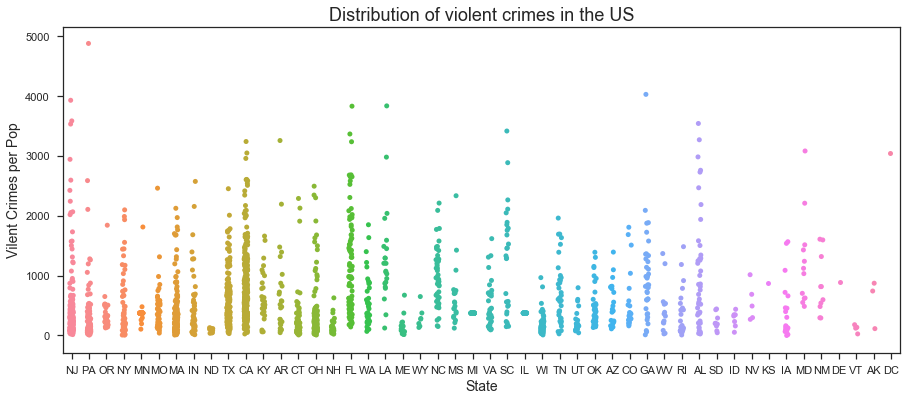

In [118]:
#Plot distibution of violent crimes among US states
plt.figure(figsize=(15,6))
sns.stripplot(x=data_unnorm['state'], y=data_unnorm['ViolentCrimesPerPop'], jitter=True)
plt.title('Distribution of violent crimes in the US',fontsize=18)
plt.xlabel('State', fontsize = 14)
plt.ylabel('Violent Crimes per Pop', fontsize = 14)

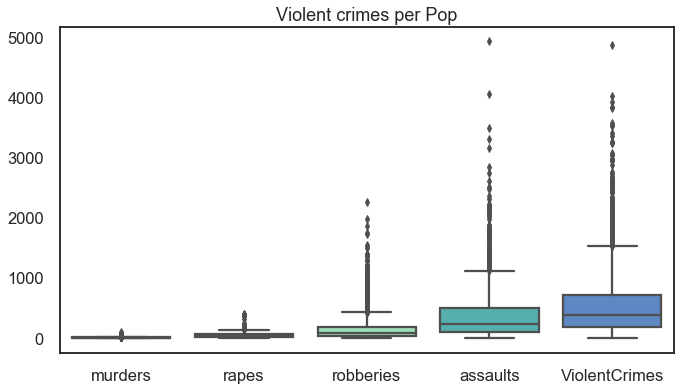

In [156]:
#Create a boxplot for violent crimes Per Pop
fig, ax = plt.subplots(1,1,figsize = (11,6))
xticklablesV = ['murders','rapes','robberies','assaults','ViolentCrimes']
sns.boxplot(data = data_unnorm[['murdPerPop', 'rapesPerPop', 'robbbPerPop', 'assaultPerPop', 'ViolentCrimesPerPop']], palette ='rainbow_r', saturation = 0.5)
plt.title("Violent crimes per Pop", fontsize = 18)
ax.set_xticklabels(xticklablesV)
plt.show()

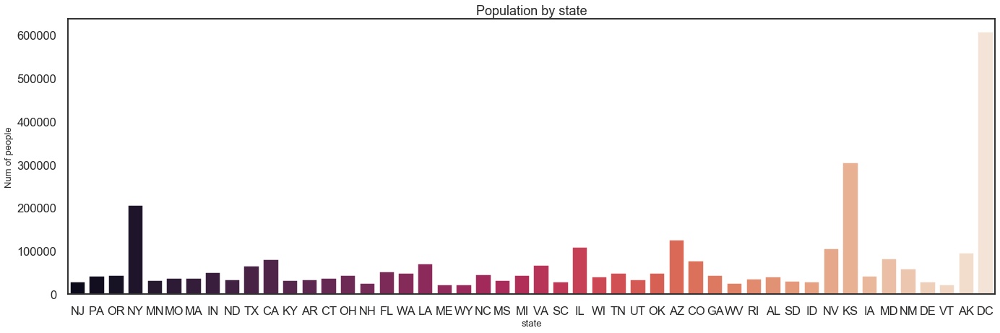

In [143]:
#Population in the USA by state
fig, ax = plt.subplots(1,1,figsize = (23,7), sharex = True)
sns.set(style="white", context="talk")
sns.barplot(x=data_unnorm['state'], y=data_unnorm['population'], palette="rocket", errwidth = 0)
plt.title("Population by state", fontsize = 18)
plt.xlabel('state', fontsize = 13)
plt.ylabel('Num of people', fontsize = 13)
plt.show()

# Moving back to our Regression problem 

Here we are going to work with normalized Communities and Crime dataset : https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime 

In [28]:
#read normalized data
names = pd.read_csv('https://raw.githubusercontent.com/ddvika/Final_progect_Sk/master/communities_attributes.csv',  delim_whitespace = True)
data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/communities/communities.data', names = names['attributes'], na_values=["?"])

In [29]:
#change values in columns to categorical data
data['state'] = data['state'].astype('category')
data['community'] = data['community'].astype('category')
data['fold'] = data['fold'].astype('category')
data.shape

(1994, 128)

In [30]:
data.head()

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,FemalePctDiv,TotalPctDiv,PersPerFam,PctFam2Par,PctKids2Par,PctYoungKids2Par,PctTeen2Par,PctWorkMomYoungKids,PctWorkMom,NumIlleg,PctIlleg,NumImmig,PctImmigRecent,PctImmigRec5,PctImmigRec8,PctImmigRec10,PctRecentImmig,PctRecImmig5,PctRecImmig8,PctRecImmig10,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.0,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,0.41,0.25,0.52,0.68,0.40,0.75,0.75,0.35,0.55,0.59,0.61,0.56,0.74,0.76,0.04,0.14,0.03,0.24,0.27,0.37,0.39,0.07,0.07,0.08,0.08,0.89,0.06,0.14,0.13,0.33,0.39,0.28,0.55,0.09,0.51,0.5,0.21,0.71,0.52,0.05,0.26,0.65,0.14,0.06,0.22,0.19,0.18,0.36,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.0,0.12,0.42,0.50,0.51,0.64,0.03,0.13,0.96,0.17,0.06,0.18,0.44,0.13,0.94,0.93,0.03,0.07,0.1,0.07,0.02,0.57,0.29,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.0,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,0.15,0.42,0.36,1.00,0.63,0.91,1.00,0.29,0.43,0.47,0.60,0.39,0.46,0.53,0.00,0.24,0.01,0.52,0.62,0.64,0.63,0.25,0.27,0.25,0.23,0.84,0.10,0.16,0.10,0.17,0.29,0.17,0.26,0.20,0.82,0.0,0.02,0.79,0.24,0.02,0.25,0.65,0.16,0.00,0.21,0.20,0.21,0.42,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.0,0.21,0.50,0.34,0.60,0.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.0,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,0.29,0.49,0.32,0.63,0.41,0.71,0.70,0.45,0.42,0.44,0.43,0.43,0.71,0.67,0.01,0.46,0.00,0.07,0.06,0.15,0.19,0.02,0.02,0.04,0.05,0.88,0.04,0.20,0.20,0.46,0.52,0.43,0.42,0.15,0.51,0.5,0.01,0.86,0.41,0.29,0.30,0.52,0.47,0.45,0.18,0.17,0.16,0.27,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.0,0.14,0.49,0.54,0.67,0.56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.0,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,0.45,0.37,0.39,0.34,0.45,0.49,0.44,0.75,0.65,0.54,0.83,0.65,0.85,0.86,0.03,0.33,0.02,0.11,0.20,0.30,0.31,0.05,0.08,0.11,0.11,0.81,0.08,0.56,0.62,0.85,0.77,1.00,0.94,0.1

In [6]:
#Profile Report, containig all the attributes distribution histograms, some simple statistics and other info
pandas_profiling.ProfileReport(data)

Number of variables,128
Number of observations,1994
Total Missing (%),12.7%
Total size in memory,2.0 MiB
Average record size in memory,1.0 KiB
Numeric,89
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,35


In [7]:
data.describe()

,county,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
count,820.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,...,1994.000000,1994.000000,1994.000000,319.000000,319.000000,319.000000,319.000000,1994.000000,319.000000,1994.000000
mean,58.826829,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,...,0.065231,0.232854,0.161685,0.163103,0.076708,0.698589,0.440439,0.094052,0.195078,0.237979
std,126.420560,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,...,0.109459,0.203092,0.229055,0.214778,0.140207,0.213944,0.405808,0.240328,0.164718,0.232985
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,0.010000,0.350000,0.020000,0.630000,0.040000,0.010000,0.340000,0.410000,0.250000,...,0.020000,0.100000,0.020000,0.040000,0.020000,0.620000,0.000000,0.000000,0.110000,0.070000
50%,23.000000,0.020000,0.440000,0.060000,0.850000,0.070000,0.040000,0.400000,0.480000,0.290000,...,0.040000,0.170000,0.070000,0.080000,0.030000,0.750000,0.500000,0.000000,0.150000,0.150000
75%,59.500000,0.050000,0.540000,0.230000,0.940000,0.170000,0.160000,0.470000,0.540000,0.360000,...,0.070000,0.280000,0.190000,0.195000,0.060000,0.840000,1.000000,0.000000,0.220000,0.330000
max,840.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
#check NaN values in columns and count them
nan_colms=data.columns[data.isnull().any()]
data[nan_colms].isnull().sum()
#num of columns, having NaNs
nan_colms.shape

(25,)

In [9]:
'''# check for '?' values in columns:
n = data.shape[0]
for header in data.columns:
    k = 0
    for i in range(n):
        if data[header].astype(str).str.find('Nan')[i] == 0:
            k+=1
    print(header, k)
'''

"# check for '?' values in columns:\nn = data.shape[0]\nfor header in data.columns:\n    k = 0\n    for i in range(n):\n        if data[header].astype(str).str.find('Nan')[i] == 0:\n            k+=1\n    print(header, k)\n"

 As we can see 'county' and 'community' both have a lot of nan values. So, let's remove them and some other **non-predictable** features like; 'state', 'communityname' and 'fold':

In [10]:
data = data.drop(columns=['state','county','community','communityname','fold'], axis=1)
data.shape

(1994, 123)

Check correlation of other 23 features, containig nans

In [74]:
correlation = data.corr()
correlation.style.background_gradient(cmap='BuPu')

In [12]:
data[['OtherPerCap']] = SimpleImputer(missing_values=np.nan, strategy = 'mean').fit(data[['OtherPerCap']]).transform(data[['OtherPerCap']])
#check for NaNs
data['OtherPerCap'].isnull().sum()

0

And delete columns containing 1675 NaNs:

In [13]:
data = data.dropna(axis=1)
# Then check for remaining NaNs:
print(data.columns[data.isnull().any()])

Index([], dtype='object')


In [14]:
#now we have 101 column remaining instead of 108:
print(data.shape)

(1994, 101)


Let's plot **hierarchical clustering**

Text(0, 0.5, 'Distance')

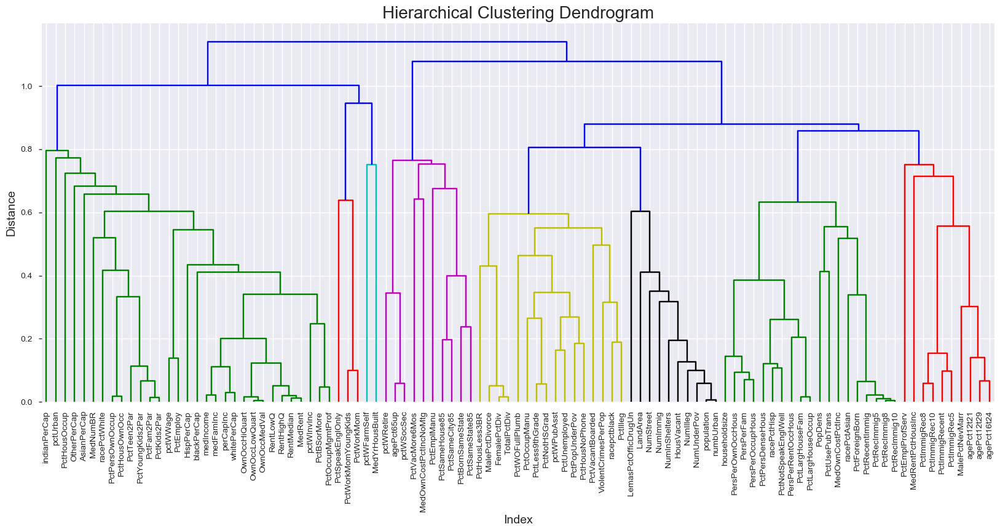

In [15]:
corr = 1 - data.corr()
corr_condensed = hc.distance.squareform(corr)
z = hc.linkage(corr_condensed, method='average')
plt.figure(figsize=(20,8))
hc.dendrogram(
    z,
    labels=corr.columns,
    show_leaf_counts=False, 
    leaf_rotation=90.,
    leaf_font_size=10.
)
plt.title('Hierarchical Clustering Dendrogram', fontsize=20)
plt.xlabel('Index',fontsize=14)
plt.ylabel('Distance',fontsize=14)


In [16]:
# list features that have the highest correlation with 'ViolentCrimesPerPop'
correlation = abs(data.corr()).round(5)
correlation = correlation.sort_values(by=['ViolentCrimesPerPop'], ascending=False)
corr_table = correlation['ViolentCrimesPerPop']
print(corr_table, 
      '\n', '\n', 
      'Top 3 highest correlations with ViolentCrimesPerPop: ', corr_table.keys()[1],corr_table[1], ',',
     corr_table.keys()[2],corr_table[2],',', corr_table.keys()[3], corr_table[3])

ViolentCrimesPerPop      1.00000
PctKids2Par              0.73842
PctIlleg                 0.73796
PctFam2Par               0.70667
racePctWhite             0.68477
PctYoungKids2Par         0.66606
PctTeen2Par              0.66158
racepctblack             0.63126
pctWInvInc               0.57632
pctWPubAsst              0.57467
FemalePctDiv             0.55603
TotalPctDiv              0.55278
PctPersOwnOccup          0.52549
MalePctDivorce           0.52541
PctPopUnderPov           0.52188
PctUnemployed            0.50423
PctHousNoPhone           0.48824
PctNotHSGrad             0.48337
PctVacantBoarded         0.48282
PctHousLess3BR           0.47449
NumIlleg                 0.47103
PctHousOwnOcc            0.47068
PctPersDenseHous         0.45290
NumUnderPov              0.44758
medFamInc                0.43911
medIncome                0.42422
HousVacant               0.42140
PctLess9thGrade          0.41110
PctLargHouseFam          0.38348
NumInShelters            0.37575
          

It seems like it is a good idea to delete the columns, full of NaNs and fulfill 1 value from 'OtherPerCap' with mean value of the whole 'OtherPerCap' column. Filling 1 value out of 1994 in a column will influece on prediction very weakly. So, do it:

In [17]:
#Go profile our data one more time now
pandas_profiling.ProfileReport(data)

Number of variables,101
Number of observations,1994
Total Missing (%),0.0%
Total size in memory,1.5 MiB
Average record size in memory,808.0 B
Numeric,70
Categorical,0
Boolean,0
Date,0
Text (Unique),0
Rejected,31


Text(0, 0.5, 'Vilent Crimes per Pop')

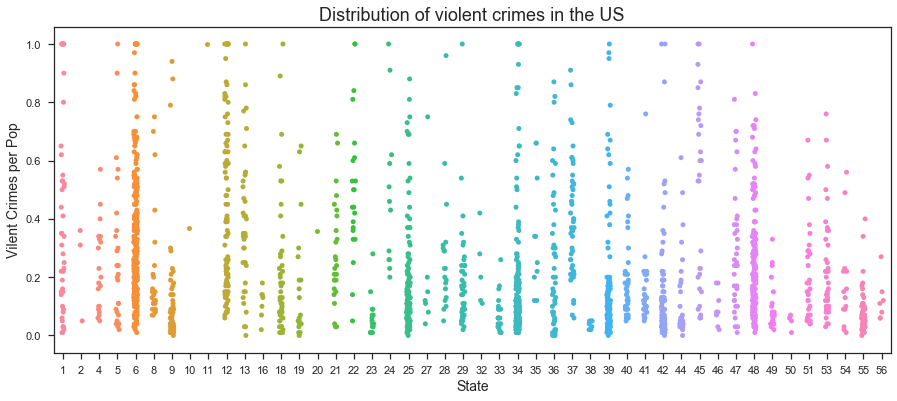

In [75]:
plt.figure(figsize=(15,6))
sns.stripplot(x=data['state'], y=data['ViolentCrimesPerPop'], jitter=True)
plt.title('Distribution of violent crimes in the US',fontsize=18)
plt.xlabel('State', fontsize = 14)
plt.ylabel('Vilent Crimes per Pop', fontsize = 14)

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA

In [19]:
data.head(4)

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.32,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.00,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.00,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.00,0.12


## 100 feature columns is a rather huge number for classical ML algorithms, so we should implement some methods to reduce dimensions.

In [20]:
X = data.iloc[:, :100].values
y = data.iloc[:, 100].values
print('X data shape: ', X.shape)
print('y data shape: ', y.shape)

X data shape:  (1994, 100)
y data shape:  (1994,)


## PCA algorithm

In [21]:
# Scale our data
scaler = StandardScaler()
X_data = scaler.fit_transform(X)
#X_train = scaler.fit_transform(X_train)
#X_test = scaler.transform(X_test)

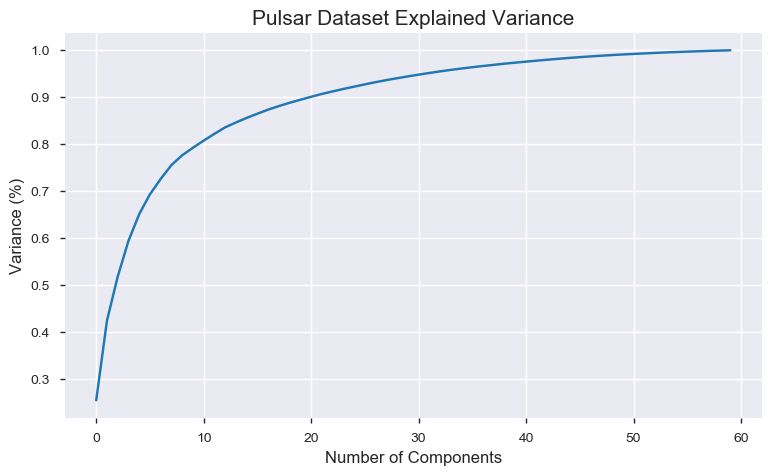

Estimated amount of features = 60


In [192]:
pca = PCA().fit(X_data)
#Cumulative Summation of the Explained Variance
plt.figure(figsize=(9,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components',fontsize=12)
plt.ylabel('Variance (%)',fontsize=12) #each component
plt.title('Pulsar Dataset Explained Variance',fontsize=15)
plt.show()

print('Estimated amount of features =', pca.n_features_)

The plot shows that selecting approx 60 components we can preserve something around 98% - 99% of the total variance of the data. It makes sense, we will not use 100% of our variance as it denotes all components. We want only the principal ones.

In [23]:
#Можно еще поэксперементировать с n_components
n_components = 60 # num of components, or dimensions, or attributes
pca = PCA(n_components = n_components)
X_data = pca.fit_transform(X_data)
pca.components_.shape
#x_new_train = pca.fit_transform(X_train)
#x_new_test = pca.transform(X_test)

(60, 100)

In [24]:
#Principal Component Analysis
def plot_pca(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 2.0/(xs.max() - xs.min())
    scaley = 2.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = y)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.2)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')

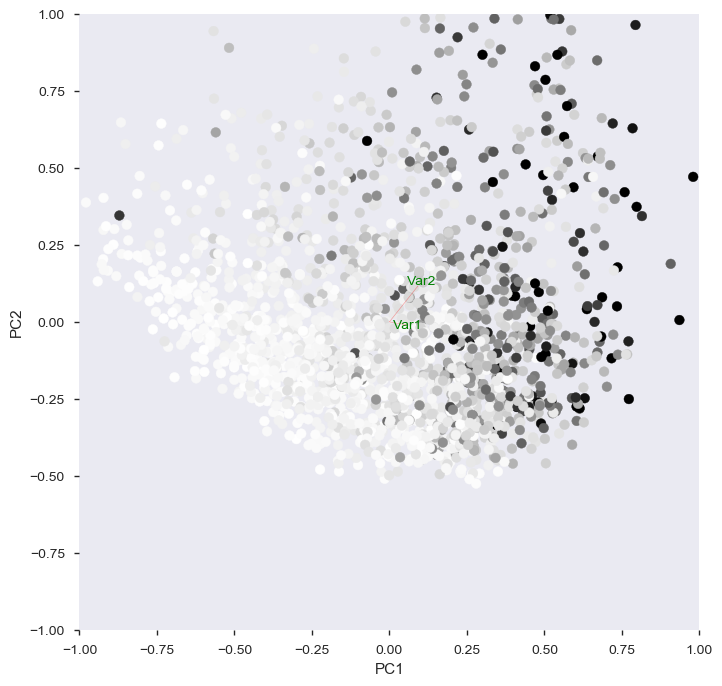

In [25]:
plt.figure(figsize=(8,8))
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

plot_pca(X_data[:,0:2],pca.components_[0:2,:] )
plt.show()

In [26]:
variance = pd.DataFrame(pca.explained_variance_ratio_)
np.cumsum(pca.explained_variance_ratio_)

array([0.25176738, 0.41998904, 0.51294908, 0.58845707, 0.64479205,
       0.68681699, 0.71921021, 0.74851422, 0.76919772, 0.7849845 ,
       0.800151  , 0.81457231, 0.82818563, 0.83849105, 0.84808228,
       0.8570031 , 0.86562887, 0.87310556, 0.88006042, 0.886483  ,
       0.89273126, 0.89869233, 0.90405224, 0.90925229, 0.91411814,
       0.91893177, 0.92358152, 0.92789707, 0.93193158, 0.93580724,
       0.93945497, 0.94301274, 0.94637811, 0.94953004, 0.95243626,
       0.95515406, 0.95771351, 0.96020049, 0.96262082, 0.9648394 ,
       0.96695447, 0.96900858, 0.97100744, 0.97290841, 0.97475191,
       0.976401  , 0.97800473, 0.97942592, 0.98081963, 0.98207896,
       0.98320525, 0.98428495, 0.98533899, 0.98634003, 0.98723824,
       0.98805174, 0.98882187, 0.98955706, 0.99024726, 0.99090815])

In [27]:
#Split data to train and test
n = 42
X_train, X_test, y_train, y_test = train_test_split(X_data, y, test_size = 0.2, random_state = n)
for i in [X_train, X_test, y_train, y_test]:
    print('shape: ', i.shape)

shape:  (1595, 60)
shape:  (399, 60)
shape:  (1595,)
shape:  (399,)


# ML alghoritms

In [134]:
from sklearn.metrics import classification_report
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, make_scorer

from sklearn.linear_model import LinearRegression, SGDRegressor, Lasso, Ridge, LassoCV, RidgeCV, BayesianRidge, ElasticNet, ElasticNetCV
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures

from warnings import simplefilter
#ignore all future warnings
simplefilter(action='ignore')


### Linear Regression, Ridge, Lasso(??), SGDRegressor

In [135]:
#Creating a dictionary with models
dict_classifiers = {
    "LinearRegression": LinearRegression(),
    "Ridge": Ridge(random_state = n),
    #"Lasso": Lasso(random_state = n),
    "SGDRegressor": SGDRegressor(random_state = n),
    "KNearest" : KNeighborsRegressor(),
    'BayesianRidge' : BayesianRidge(),
    'ElasticNetCV' : ElasticNetCV()
}



In [136]:
#Creating a function that is going fit data into models and predict
def split_fit_predict(X_train, y_train, X_test, y_test):
    dict_models = {}
    accuracies = {}
    
    for classifier_name, classifier in list(dict_classifiers.items()):
        
        classifier.fit(X_train, y_train)
        dict_models[classifier_name] = classifier.predict(X_test)
        
        print(classifier_name)
        print('Model R2 score on the test data: ', classifier.score(X_test, y_test))
        print('Model MSE on the test data: ', mean_squared_error(y_test, dict_models[classifier_name]))
        print('Model MAE on the test data: ', mean_absolute_error(y_test, dict_models[classifier_name]))
                
        # Applying k-Fold Cross Validation
        accuracies[classifier_name] = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 5, 
                                                     scoring = make_scorer(r2_score))
        print('k-Fold CV model performance mean(R2):' + str(accuracies[classifier_name].mean()) + '\n' + '\n')
        
    return accuracies

In [137]:

accuracies = split_fit_predict(X_train, y_train, X_test, y_test)

LinearRegression
Model R2 score on the test data:  0.6517189110115603
Model MSE on the test data:  0.016934925100411377
Model MAE on the test data:  0.09370630874921008
k-Fold CV model performance mean(R2):0.6390058569605539


Ridge
Model R2 score on the test data:  0.6523533645958925
Model MSE on the test data:  0.016904075237269053
Model MAE on the test data:  0.09361942579891945
k-Fold CV model performance mean(R2):0.6426070052976905


SGDRegressor
Model R2 score on the test data:  0.6502549268841833
Model MSE on the test data:  0.01700611030778893
Model MAE on the test data:  0.09384504906290918
k-Fold CV model performance mean(R2):0.6350379177451035


KNearest
Model R2 score on the test data:  0.5851801769151352
Model MSE on the test data:  0.020170324649298597
Model MAE on the test data:  0.09793186372745491
k-Fold CV model performance mean(R2):0.601464050517855


BayesianRidge
Model R2 score on the test data:  0.6572332161518659
Model MSE on the test data:  0.016666795858013755


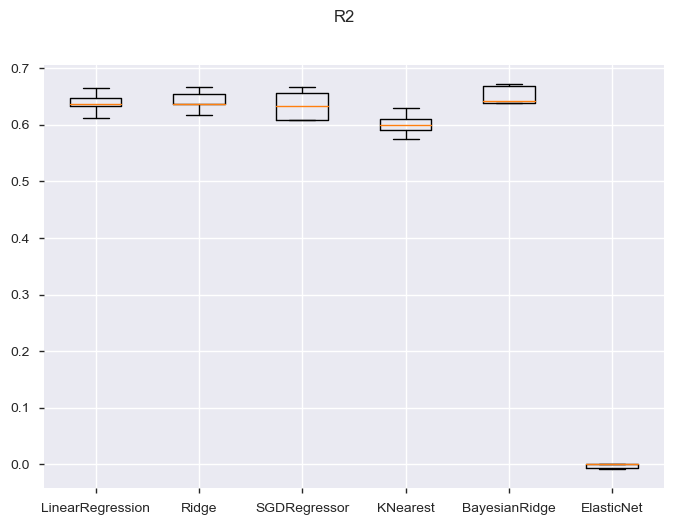

In [128]:
#Plotting R2 accuracies on CV 
fig = plt.figure()
fig.suptitle('R2')
ax = fig.add_subplot(111)
plt.boxplot(accuracies.values())
ax.set_xticklabels(accuracies.keys())
plt.show()

Linear Regression and Ridge shows are almost the same resutls so we are choosing just one of them - Ridge regression

Lasso shows the lowest R2 score



**Lets perform Grid Search for them and tune their parameters**

In [33]:
#Grid Search for Ridge
ridgeCV = RidgeCV(alphas=(0.01, 0.1, 1.0, 10.0), cv = 5).fit(X_train, y_train)

print("MSE Training Error: ", mean_squared_error(y_train, ridgeCV.predict(X_train)))
print("MSE Testing Error: ", mean_squared_error(y_test, ridgeCV.predict(X_test)))
print("Alpha chosen: ", ridgeCV.alpha_)
print("R2 Score: ", RidgeCV.score(ridgeCV,X=X_test,y= y_test))

MSE Training Error:  0.017778964100442517
MSE Testing Error:  0.018125811796898844
Alpha chosen:  10.0
R2 Score:  0.62155696538073


In [273]:
"""#Grid Search for Lasso
lassoCV = LassoCV(alphas=(0.01, 0.1, 1.0, 10.0), cv = 5).fit(X_train, y_train)

print("MSE Training Error: ", mean_squared_error(y_train, lassoCV.predict(X_train)))
print("MSE Testing Error: ", mean_squared_error(y_test, lassoCV.predict(X_test)))
print("Alpha chosen: ", lassoCV.alpha_)
print("R2 Score: ", lassoCV.score(X_test, y_test))"""

'#Grid Search for Lasso\nlassoCV = LassoCV(alphas=(0.01, 0.1, 1.0, 10.0), cv = 5).fit(X_train, y_train)\n\nprint("MSE Training Error: ", mean_squared_error(y_train, lassoCV.predict(X_train)))\nprint("MSE Testing Error: ", mean_squared_error(y_test, lassoCV.predict(X_test)))\nprint("Alpha chosen: ", lassoCV.alpha_)\nprint("R2 Score: ", lassoCV.score(X_test, y_test))'

### Lets check Random Forest, Decision Trees, SVR

In [ ]:
dict_classifiers = {
    "RFR 100 trees": RandomForestRegressor(n_estimators=100, random_state=n),
    "DecisionTree": DecisionTreeRegressor(random_state = n),
    "SVR": SVR()
}

In [ ]:
accuracies = split_fit_predict(X_train, y_train, X_test, y_test)

In [ ]:
#Plotting R2 accuracies on CV 
fig = plt.figure(figsize = (15, 9))
fig.suptitle('R2')
ax = fig.add_subplot(111)
plt.boxplot(accuracies.values())
ax.set_xticklabels(accuracies.keys())
plt.show()

**Tuning RFR, DTR, SVR parametrs**

In [218]:
#Class that allows to GridSearch through multiple models by adding them to the dictionary
class EstimatorSelectionHelper:

    def __init__(self, models, params):
        if not set(models.keys()).issubset(set(params.keys())):
            missing_params = list(set(models.keys()) - set(params.keys()))
            raise ValueError("Some estimators are missing parameters: %s" % missing_params)
        self.models = models
        self.params = params
        self.keys = models.keys()
        self.grid_searches = {}

    def fit(self, X, y, cv=5, n_jobs=-1, verbose=1, scoring='r2', refit=False):
        for key in self.keys:
            print("Running GridSearchCV for %s." % key)
            model = self.models[key]
            params = self.params[key]
            gs = GridSearchCV(model, params, cv=cv, n_jobs=n_jobs,
                              verbose=verbose, scoring=scoring, refit=refit,
                              return_train_score=True)
            gs.fit(X,y)
            print("Best params and score for %s." % key)
            print(gs.best_params_)
            print(gs.best_score_)
            self.grid_searches[key] = gs    

    def score_summary(self, sort_by='mean_score'):
        def row(key, scores, params):
            d = {
                 'estimator': key,
                 'min_score': min(scores),
                 'max_score': max(scores),
                 'mean_score': np.mean(scores),
                 'std_score': np.std(scores),
            }
            return pd.Series({**params,**d})

        rows = []
        for k in self.grid_searches:
            print(k)
            params = self.grid_searches[k].cv_results_['params']
            scores = []
            for i in range(self.grid_searches[k].cv):
                key = "split{}_test_score".format(i)
                r = self.grid_searches[k].cv_results_[key]        
                scores.append(r.reshape(len(params),1))

            all_scores = np.hstack(scores)
            for p, s in zip(params,all_scores):
                rows.append((row(k, s, p)))

        df = pd.concat(rows, axis=1).T.sort_values([sort_by], ascending=False)

        columns = ['estimator', 'min_score', 'mean_score', 'max_score', 'std_score']
        columns = columns + [c for c in df.columns if c not in columns]

        return df[columns]
    

In [220]:
#Creating dictionaries for models and their parameters
models1 = {
    "RFR": RandomForestRegressor(),
    "DecisionTree": DecisionTreeRegressor(random_state = 42),
    "SVR": SVR()
}

params1 = {
    'RFR': { 'n_estimators': [50, 100, 200, 300, 400, 500, 600, 800, 1000],
             'max_depth': [1, 3, 5, 10, 20],
             'min_samples_leaf' : [1, 2, 4, 6, 8],
             'bootstrap' : [True, False],
             'min_samples_split': [2, 5, 10]
           },
    
    'DecisionTree': {  'min_samples_leaf' : [1, 5, 10, 20, 50, 100],
                       'max_depth' : [1, 3, 5, 10, 20],
                       'min_samples_split': [2, 5, 10]
                     },
    
    'SVR':  { 'kernel': ('linear', 'rbf','poly'), 
              'C':[1, 5, 10],
              'gamma': [0.001, 0.0001, 0.01],
              'epsilon':[0.1,0.2,0.5,0.3]
            }
    
}

grid = EstimatorSelectionHelper(models1, params1)
grid.fit(X_train, y_train, n_jobs = -1)


Running GridSearchCV for RFR.
Fitting 5 folds for each of 1350 candidates, totalling 6750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1218 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 1768 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 2418 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done 3168 tasks      | elapsed: 21.3min
[Parallel(n_jobs=-1)]: Done 4018 tasks      | elapsed: 25.1min
[Parallel(n_jobs=-1)]: Done 4968 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 6018 tasks      | elapsed: 48.1min


Best params and score for RFR.
{'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
0.6076418950066425
Running GridSearchCV for DecisionTree.
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 6750 out of 6750 | elapsed: 63.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


Best params and score for DecisionTree.
{'max_depth': 10, 'min_samples_leaf': 20, 'min_samples_split': 2}
0.48979163460995556
Running GridSearchCV for SVR.
Fitting 5 folds for each of 108 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:   13.6s


Best params and score for SVR.
{'C': 5, 'epsilon': 0.1, 'gamma': 0.001, 'kernel': 'rbf'}
0.6647793760093372


[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:  1.6min finished


In [221]:
grid.score_summary(sort_by='max_score')


RFR
DecisionTree
SVR


,estimator,min_score,mean_score,max_score,std_score,C,bootstrap,epsilon,gamma,kernel,max_depth,min_samples_leaf,min_samples_split,n_estimators
1441,SVR,0.62096,0.662827,0.691259,0.0232335,1,NaN,0.1,0.001,rbf,NaN,NaN,NaN,NaN
1477,SVR,0.615773,0.664779,0.684449,0.0251392,5,NaN,0.1,0.001,rbf,NaN,NaN,NaN,NaN
1513,SVR,0.61104,0.65945,0.674881,0.0243979,10,NaN,0.1,0.001,rbf,NaN,NaN,NaN,NaN
1516,SVR,0.624121,0.651741,0.674514,0.0184736,10,NaN,0.1,0.0001,rbf,NaN,NaN,NaN,NaN
1480,SVR,0.623748,0.648991,0.67417,0.0183984,5,NaN,0.1,0.0001,rbf,NaN,NaN,NaN,NaN
1444,SVR,0.614284,0.630321,0.665284,0.0185245,1,NaN,0.1,0.0001,rbf,NaN,NaN,NaN,NaN
1512,SVR,0.619841,0.64296,0.662698,0.0154047,10,NaN,0.1,0.001,linear,NaN,NaN,NaN,NaN
1518,SVR,0.619841,0.64296,0.662698,0.0154047,10,NaN,0.1,0.01,linear,NaN,NaN,NaN,NaN
1515,SVR,0.619841,0.64296,0.662698,0.0154047,10,NaN,0.1,0.0001,linear,NaN,NaN,NaN,NaN
1482,SVR,0.619745,0.642703,0.662481,0.0153866,5,NaN,0.1,0.01,linear,NaN,NaN,NaN,NaN


In [91]:
#Trying to use best features from Ridge regression to feed them to RandomForestRegression by using SelectFromModel method
'''
from sklearn.feature_selection import SelectFromModel
pipe = make_pipeline(SelectFromModel(ridgeCV, '0.65*mean'), 
                    #SVR(C = 1, epsilon = 0.1, gamma = 0.001, kernel = 'rbf'))
                     #RandomForestRegressor(bootstrap= True, max_depth = 10, min_samples_leaf = 4, min_samples_split= 2, n_estimators= 500))
pipe.fit(X_train, y_train)
y_pred_lul = pipe.predict(X_test)
print('Model MSE on the test data: ', mean_squared_error(y_test, y_pred_lul))
print('Model MAE on the test data: ', mean_absolute_error(y_test, y_pred_lul))
print(r2_score(y_test, y_pred_lul))


Model MSE on the test data:  0.01785331118927109
Model MAE on the test data:  0.09241706581410376
0.6272464185231204


Results are even worth

# Lets try to select best features without PCA, but by using RFE(Recursive Feature Ellimination)

In [195]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFECV, RFE

#
X = data.iloc[:, :100].values
y = data.iloc[:, 100].values
print('X data shape: ', X.shape)
print('y data shape: ', y.shape)

# Scale our data
scaler = StandardScaler()
X = scaler.fit_transform(X)

X data shape:  (1994, 100)
y data shape:  (1994,)


### Lets check the optimal amount of features for Ridge regression with RFE

Amount of features = 42


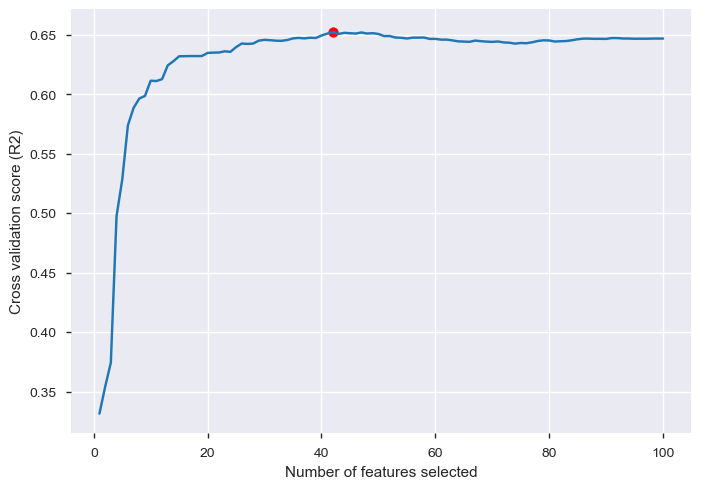

In [193]:
#Training RFE on the train data
estimator = LinearRegression()
selector = RFECV(estimator, step=1, cv=5, scoring = 'r2')
selector = selector.fit(X_train, y_train)


print('Amount of features =', selector.n_features_)

#Plotting the results
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (R2)")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.scatter(selector.n_features_,np.max(selector.grid_scores_), c = 'red')
plt.show()



In [196]:
#Defining the Dictionary with models once again for RFE
dict_classifiers = {
    "LinearRegression": LinearRegression(),
    "Ridge": Ridge(random_state = n),
    #"Lasso": Lasso(random_state = n),
    "SGDRegressor": SGDRegressor(random_state = n),
    #"KNearest" : KNeighborsRegressor(),  # Cannot be used for RFE, because KNearest not provide any metrics
    'BayesianRidge' : BayesianRidge(),
    'ElasticNetCV' : ElasticNetCV(),
    "RFR 100 trees": RandomForestRegressor(n_estimators=100, random_state=n),
    "DecisionTree": DecisionTreeRegressor(random_state = n),
    "SVR": SVR(kernel = 'linear')
}



In [197]:
def split_fit_predict(X, y):
    dict_models = {}
    accuracies = {}
    
    for classifier_name, classifier in list(dict_classifiers.items()):
        X_train,X_test,y_train,y_test=train_test_split(X, y,
                test_size=0.2,random_state=42,)
        
        selector = RFECV(estimator = classifier ,min_features_to_select =  41, step=1, scoring = 'r2')
        selector = selector.fit(X_train, y_train)
        dict_models[classifier_name] = selector.predict(X_test)
        
        print(classifier_name)
        print('Model R2 score on the test data: ', selector.score(X_test, y_test))
        print('Model MSE on the test data: ', mean_squared_error(y_test, dict_models[classifier_name]))
        print('Model MAE on the test data: ', mean_absolute_error(y_test, dict_models[classifier_name]))
                
        # Applying k-Fold Cross Validation
        accuracies[classifier_name] = cross_val_score(estimator = selector, X = X_train, y = y_train, cv = 5, 
                                                     scoring = make_scorer(r2_score), n_jobs = -1)
        print('k-Fold CV model performance mean(R2):' + str(accuracies[classifier_name].mean()) + '\n' + '\n')
        
    return accuracies

In [198]:
split_fit_predict(X, y)


'''X_t=selector.fit_transform(X,y)
X_train,X_test,y_train,y_test=train_test_split(X, y,
                test_size=0.25,random_state=42,)
X_train_t,X_test_t,y_train_t,y_test_t=train_test_split(X_t, y,
                test_size=0.25,random_state=42)
clf=SVR(kernel = 'linear')
clf_t=SVR(kernel = 'linear')
clf.fit(X_train,y_train)
clf_t.fit(X_train_t,y_train_t)
print("Cleaned DataSet: test score=%s"%(clf.score(X_test,y_test)))
print("Selected features by RFE DataSet: test score=%s"%(clf_t.score(X_test_t,y_test_t)))'''


LinearRegression
Model R2 score on the test data:  0.6414841983593969
Model MSE on the test data:  0.017171382090014026
Model MAE on the test data:  0.09296828374621989
k-Fold CV model performance mean(R2):0.6481841147874968


Ridge
Model R2 score on the test data:  0.6305468829337089
Model MSE on the test data:  0.01769523298125525
Model MAE on the test data:  0.09444372949815828
k-Fold CV model performance mean(R2):0.647168541337068


SGDRegressor
Model R2 score on the test data:  0.6234381539550233
Model MSE on the test data:  0.01803571086509963
Model MAE on the test data:  0.0957421584334514
k-Fold CV model performance mean(R2):0.6363918955110432


BayesianRidge
Model R2 score on the test data:  0.6403924553835744
Model MSE on the test data:  0.017223671935248597
Model MAE on the test data:  0.09225928678450492
k-Fold CV model performance mean(R2):0.6545634630209826


ElasticNetCV
Model R2 score on the test data:  0.6422663174718832
Model MSE on the test data:  0.01713392191096766

'X_t=selector.fit_transform(X,y)\nX_train,X_test,y_train,y_test=train_test_split(X, y,\n                test_size=0.25,random_state=42,)\nX_train_t,X_test_t,y_train_t,y_test_t=train_test_split(X_t, y,\n                test_size=0.25,random_state=42)\nclf=SVR(kernel = \'linear\')\nclf_t=SVR(kernel = \'linear\')\nclf.fit(X_train,y_train)\nclf_t.fit(X_train_t,y_train_t)\nprint("Cleaned DataSet: test score=%s"%(clf.score(X_test,y_test)))\nprint("Selected features by RFE DataSet: test score=%s"%(clf_t.score(X_test_t,y_test_t)))'

In [16]:
r_models = ['Linear Regression', 'Ridge Regression', 'SGD Regressor', 'BayesianRidge'
            , 'ElasticNetCV', 'Random Forest', 'Decision Trees', 'Support Vector Regression']
r_r2_scores = [0.641, 0.63,0.623,0.64, 0.642, 0.614,0.267, 0.625]
r_mse_scores = [0.017, 0.017, 0.018, 0.017, 0.017, 0.018,0.035, 0.017 ]
r_mae_scores = [0.092, 0.094, 0.095, 0.092, 0.092, 0.093,0.119, 0.096]

**Seems like RFE and PCA works almost the same. Actually PCA performs a little bit better(1-2% for R2 Score)**

In [180]:
X = data.iloc[:, :100].values
y = data.iloc[:, 100].values
print('X data shape: ', X.shape)
print('y data shape: ', y.shape)

X_train,X_test,y_train,y_test=train_test_split(X, y,
                test_size=0.2,random_state=42,)
        

X data shape:  (1994, 100)
y data shape:  (1994,)


## comparing PCA and KBest

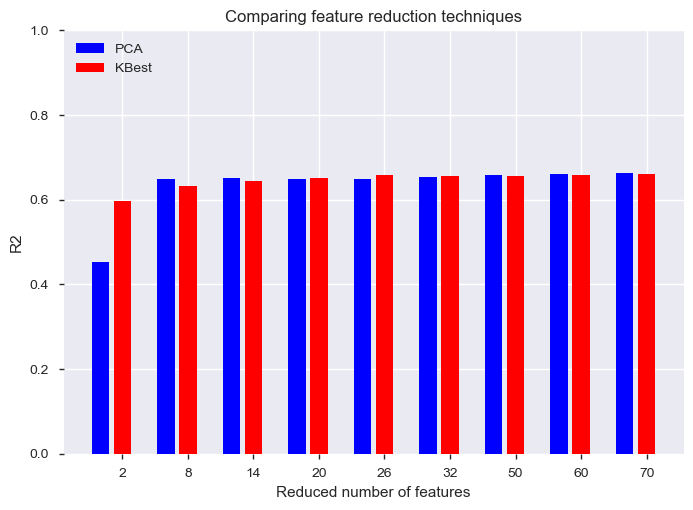

In [186]:
from sklearn.model_selection import ShuffleSplit
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression


pipe = Pipeline([('reduce_dim', PCA()), 
                 ('regressor', BayesianRidge())])

N_FEATURES_OPTIONS = [2, 8, 14, 20, 26, 32, 50, 60, 70]

param_grid = [
    {
        'reduce_dim': [PCA()],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
    },
    {
        'reduce_dim': [SelectKBest(mutual_info_regression)],
        'reduce_dim__k': N_FEATURES_OPTIONS,
    },
]

reducer_labels = ['PCA', 'KBest']

cv = ShuffleSplit(n_splits=10, test_size=0.3, random_state=42)

grid = GridSearchCV(pipe, cv=cv, n_jobs=1, param_grid=param_grid)
grid.fit(X_train, y_train)

mean_scores = np.array(grid.cv_results_['mean_test_score'])
mean_scores = mean_scores.reshape(-1, len(N_FEATURES_OPTIONS))
bar_offsets = (np.arange(len(N_FEATURES_OPTIONS)) *
               (len(reducer_labels) + 1) + .5)

plt.figure()
COLORS = 'br'
for i, (label, reducer_scores) in enumerate(zip(reducer_labels, mean_scores)):
    plt.bar(bar_offsets + i, reducer_scores, label=label, color=COLORS[i])

plt.title("Comparing feature reduction techniques")
plt.xlabel('Reduced number of features')
plt.xticks(bar_offsets + len(reducer_labels) / 2, N_FEATURES_OPTIONS)
plt.ylabel('R2')
plt.ylim((0, 1))
plt.legend(loc='upper left')
plt.show()

**We have mannualy checked PCA and KBest methods for different models.And for all of them PCA performs the same or a little bit better then KBest**

# Report

## Regression models and their scores

In [18]:
fig = go.Figure(data=[go.Table(header=dict(values=['Regression model', 'R2 Score', 'MSE Score', 'MAE Score' ]),
                 cells=dict(values=[r_models,r_r2_scores, r_mse_scores, r_mae_scores]))])
fig.show()

# Conclusion

We observe following regression algorithm: Linear Regression, Ridge Regression, Lasso Regression, SGD Regressor, BayesianRidge, ElasticNetCV, Random Forest, Decision Trees, Support Vector Regression (SVR). We obtained not very good results for all the models - all of them show approximately 0.61-0.64 R2 score. The relatively poor performance of the algorithms could be a consequence to a certain factor of randomness in various crimes and associated features.
* **The worst prediction** result belongs to Decision Trees and this can be explained by the following: branches of the decision trees are more rigid and give accurate results only if the test set follows the pattern modelled.
* **The best results** belong both to Linear Regression and ElasticNetCV models. Linear regression algorithm could handle randomness in the test samples to a certain extent (without undergoing too much of prediction error). And ElasticNetCV combines LASSO and ridge methods, combining L1 and L2 regularizations, it reduces the danger of overfitting.
* **PCA** performs **better** than RFE and Kbest methods